## **Import modules**


In [1]:
import numpy as np
import tensorflow as tf
from google.colab import drive
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import time
from datetime import timedelta

# **Load paths of training data and store them in numpy array**
First mount the google drive, then iterate over all photos in "pizza" folder and append their paths to "image_path" list

In [2]:
drive.mount('/content/drive', force_remount=True)

data_path = '/content/drive/MyDrive/pizza'
image_names = os.listdir(data_path)
image_paths = []

for image_name in image_names:
  image_path = os.path.join(data_path, image_name)
  image_paths.append(image_path)

image_paths = np.array(image_paths)
print(f'Found {image_paths.shape[0]} image paths')

Mounted at /content/drive
Found 3618 image paths


## **Plot some samples from training data**

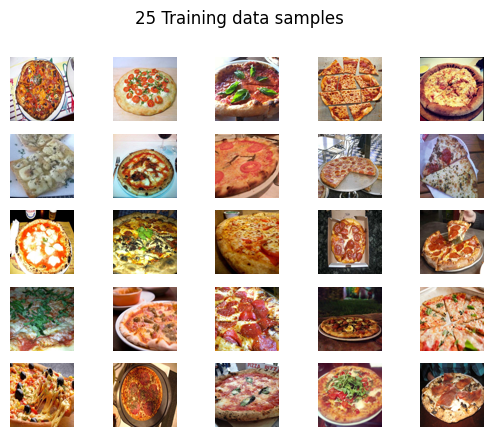

In [3]:
  fig, axs = plt.subplots(5, 5)
  fig.suptitle(f"25 Training data samples")
  random_paths = np.random.choice(image_paths, size=25)
  id = 0

  for row in range(5):
    for column in range(5):
      image = Image.open(random_paths[id])
      image = image.resize((64, 64))
      axs[row, column].imshow(image)
      axs[row, column].axis("off")
      id += 1

  plt.show()
  plt.close()

## **Define constants**


In [4]:
batch_size = 32
leaky_relu_slope = 0.2
learning_rate = 0.0002
beta1 = 0.5
latent_space_dimension = 100
dropout_rate = 0.5

## **Create functions which make generator and discriminator model**
*   generator model is responsible for creating fake pizza images
*   discriminator is used for adjusting generators weights so it can generate better fake images


In [5]:
def make_generator_model():
  input = tf.keras.Input(shape=(latent_space_dimension, ))

  x = tf.keras.layers.Dense(4 * 4 * 128)(input)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)

  x = tf.keras.layers.Reshape((4, 4, 128))(x)
  x = tf.keras.layers.Conv2DTranspose(512, (5, 5), strides=(1, 1), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.Dropout(dropout_rate)(x)

  x = tf.keras.layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)
  x = tf.keras.layers.Dropout(dropout_rate)(x)

  x = tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)

  x = tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)

  x = tf.keras.layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.ReLU()(x)

  x = tf.keras.layers.Dense(3, activation='tanh')(x)

  model = tf.keras.Model(input, x)

  return model

In [6]:
def make_discriminator_model():
  input = tf.keras.Input(shape=(64, 64, 3))

  x = tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(input)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(alpha=leaky_relu_slope)(x)

  x = tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(alpha=leaky_relu_slope)(x)

  x = tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(alpha=leaky_relu_slope)(x)

  x = tf.keras.layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
  x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.LeakyReLU(alpha=leaky_relu_slope)(x)

  x = tf.keras.layers.Flatten()(x)
  x = tf.keras.layers.Dense(1, activation='sigmoid')(x)

  model = tf.keras.Model(input, x)

  return model

## **Create models, optimizers, and crossentropy calculator**


In [7]:
generator = make_generator_model()
discriminator = make_discriminator_model()
generator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta1)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate, beta1)
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

## **Create functions for smoothing labels, adding noise to labels and calculating losses**
*   Label smoothing prevents discriminator from being too confident in its predictions, otherwise our generator could stop improving. It keeps negative labels in [0, 0.3] range and positive labels in [0.7, 1] range.
*   Introducing noisy labels also prevents discriminator from being too confident, it flips the labels to the opposite site. For example 0.7 will be flipped for 0.3.
*   Discriminator loss is calculated by summing cross entropy losses of discriminator for batch of real and batch of fake (generated) images
*   Generator loss is calculated by calculating cross entropy loss between labels predicted by discriminator for batch of fake images and smoothened ones



In [8]:
def smooth_positive_labels(y):
  return y - 0.3 * np.random.random(y.shape)

def smooth_negative_labels(y):
  return y + 0.3 * np.random.random(y.shape)

def noisy_labels(y, flip_probability):
  n_labels_to_flip = int(flip_probability * int(y.shape[0]))
  ids_labels_to_flip = np.random.randint(0, int(y.shape[0]), n_labels_to_flip)

  for i in range(int(y.shape[0])):
    if i in ids_labels_to_flip:
      y[i] = 1 - y[i]

  return y

def discriminator_loss(real_output, fake_output):
  real_output_noise = noisy_labels(np.ones_like(real_output), 0.05)
  fake_output_noise = noisy_labels(np.zeros_like(fake_output), 0.05)
  real_output_smooth = smooth_positive_labels(real_output_noise)
  fake_output_smooth = smooth_negative_labels(fake_output_noise)

  real_loss = cross_entropy(real_output_smooth, real_output)
  fake_loss = cross_entropy(fake_output_smooth, fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  fake_output_smooth = smooth_positive_labels(np.ones_like(fake_output))
  fake_loss = cross_entropy(fake_output_smooth, fake_output)
  return fake_loss

## **Make functions for generating image batches and plotting samples from generator**

In [9]:
def generate_batches(batch_size, image_paths):
  number_batches = image_paths.shape[0] // batch_size
  batches = np.random.choice(
    image_paths,
    size=(number_batches, batch_size),
    replace=False
  )

  for batch in batches:
    images = []

    for image_path in batch:
      image = Image.open(image_path)
      image = image.resize((64, 64))
      image = (np.array(image) - 127.5) / 127.5
      images.append(image)

    yield np.array(images)


def plot_samples_from_generator(epoch, rows, columns):
  random_gen_input = np.random.randn(rows * columns, 100)
  generated_images = generator.predict(random_gen_input, verbose=0)
  generated_images = ((generated_images * 127.5) + 127.5).astype(int)
  fig, axs = plt.subplots(rows, columns)
  fig.suptitle(f"Epoch number: {epoch}")
  id = 0

  for row in range(rows):
    for column in range(columns):
      axs[row, column].imshow(generated_images[id])
      axs[row, column].axis("off")
      id += 1

  plt.show()
  plt.close()


## **Create train_step function and main training loop**
*   train_step function calculates gradients for discriminator and generator and applies them using optimizers which were defined above
*   Training loop calls train_step function for each image_batch each epoch



In [10]:
def train_step(image_batch):
  noise = np.random.randn(batch_size, latent_space_dimension)

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    fake_images = generator(noise, training=True)
    real_output = discriminator(image_batch, training=True)
    fake_output = discriminator(fake_images, training=True)
    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)

  generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  return gen_loss, disc_loss

def train(epochs):
  start = time.time()

  for epoch in range(epochs):
      gen_epoch_losses, disc_epoch_losses = [], []

      for batch in generate_batches(batch_size, image_paths):
        gen_loss, disc_loss = train_step(batch)
        gen_epoch_losses.append(gen_loss)
        disc_epoch_losses.append(disc_loss)

      gen_epoch_loss = np.mean(gen_epoch_losses)
      disc_epoch_loss = np.mean(disc_epoch_losses)
      total_time = str(timedelta(seconds = (time.time() - start)))

      print(f'Epoch {epoch + 1} ({total_time}):', end="")
      print(f'disc loss: {disc_epoch_loss:.2f}, gen loss: {gen_epoch_loss:.2f}')

      if epoch % 10 == 0:
        plot_samples_from_generator(epoch + 1, 4, 4)

      if epoch % 20 == 0 and epoch != 0:
        generator.save_weights(f'generator_weights/epoch{epoch + 1}')
        discriminator.save_weights(f'discriminator_weights/epoch{epoch + 1}')

Epoch 1 (0:01:46.382011):disc loss: 1.86, gen loss: 3.34


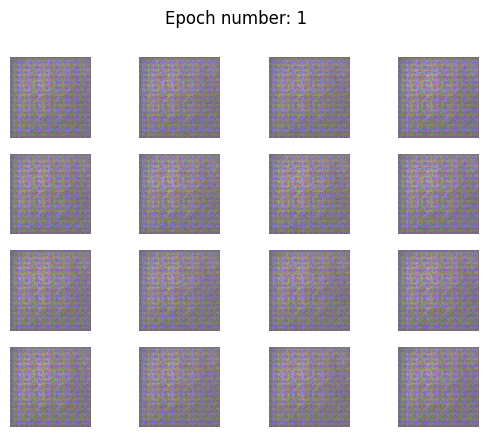

Epoch 2 (0:02:26.085461):disc loss: 1.09, gen loss: 1.63
Epoch 3 (0:03:05.331861):disc loss: 1.01, gen loss: 1.48
Epoch 4 (0:03:44.724780):disc loss: 1.01, gen loss: 1.56
Epoch 5 (0:04:24.101673):disc loss: 1.03, gen loss: 1.47
Epoch 6 (0:05:02.862905):disc loss: 1.02, gen loss: 1.54
Epoch 7 (0:05:42.607572):disc loss: 1.02, gen loss: 1.54
Epoch 8 (0:06:21.992697):disc loss: 1.04, gen loss: 1.41
Epoch 9 (0:07:01.597609):disc loss: 1.15, gen loss: 1.34
Epoch 10 (0:07:40.408700):disc loss: 1.15, gen loss: 1.39
Epoch 11 (0:08:19.083593):disc loss: 1.13, gen loss: 1.30


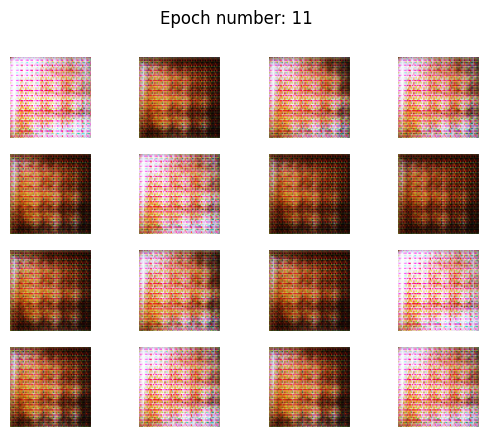

Epoch 12 (0:08:59.126085):disc loss: 1.12, gen loss: 1.31
Epoch 13 (0:09:38.154576):disc loss: 1.14, gen loss: 1.33
Epoch 14 (0:10:17.264161):disc loss: 1.15, gen loss: 1.28
Epoch 15 (0:10:55.101789):disc loss: 1.12, gen loss: 1.24
Epoch 16 (0:11:33.824383):disc loss: 1.15, gen loss: 1.37
Epoch 17 (0:12:12.432794):disc loss: 1.10, gen loss: 1.28
Epoch 18 (0:12:51.625802):disc loss: 1.12, gen loss: 1.37
Epoch 19 (0:13:29.179874):disc loss: 1.11, gen loss: 1.30
Epoch 20 (0:14:08.428703):disc loss: 1.10, gen loss: 1.24
Epoch 21 (0:14:47.336940):disc loss: 1.12, gen loss: 1.28


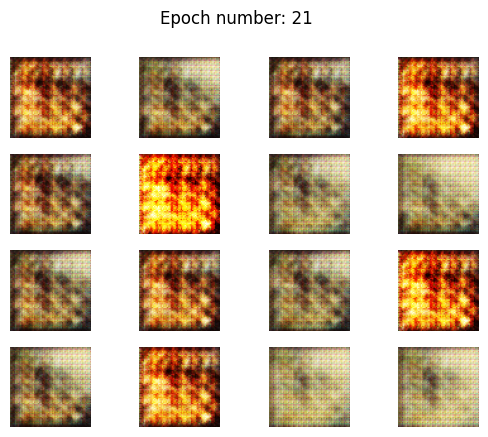

Epoch 22 (0:15:26.846037):disc loss: 1.12, gen loss: 1.31
Epoch 23 (0:16:04.871493):disc loss: 1.12, gen loss: 1.27
Epoch 24 (0:16:43.882831):disc loss: 1.13, gen loss: 1.24
Epoch 25 (0:17:22.507302):disc loss: 1.17, gen loss: 1.22
Epoch 26 (0:18:01.444664):disc loss: 1.15, gen loss: 1.27
Epoch 27 (0:18:40.074477):disc loss: 1.12, gen loss: 1.27
Epoch 28 (0:19:19.120592):disc loss: 1.16, gen loss: 1.19
Epoch 29 (0:19:58.658623):disc loss: 1.16, gen loss: 1.20
Epoch 30 (0:20:38.188313):disc loss: 1.14, gen loss: 1.21
Epoch 31 (0:21:17.643140):disc loss: 1.15, gen loss: 1.22


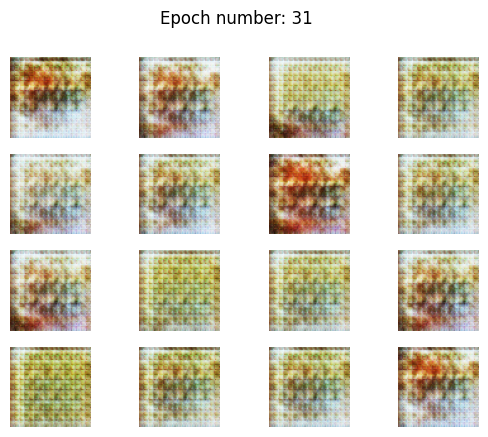

Epoch 32 (0:21:56.863618):disc loss: 1.14, gen loss: 1.17
Epoch 33 (0:22:36.247262):disc loss: 1.15, gen loss: 1.19
Epoch 34 (0:23:16.412566):disc loss: 1.19, gen loss: 1.16
Epoch 35 (0:23:56.479672):disc loss: 1.18, gen loss: 1.15
Epoch 36 (0:24:36.156883):disc loss: 1.18, gen loss: 1.15
Epoch 37 (0:25:15.019900):disc loss: 1.18, gen loss: 1.15
Epoch 38 (0:25:54.400559):disc loss: 1.19, gen loss: 1.13
Epoch 39 (0:26:34.334171):disc loss: 1.15, gen loss: 1.20
Epoch 40 (0:27:13.863787):disc loss: 1.16, gen loss: 1.16
Epoch 41 (0:27:53.322111):disc loss: 1.18, gen loss: 1.17


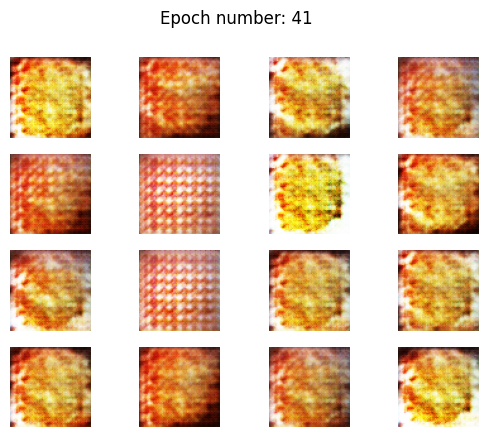

Epoch 42 (0:28:33.148285):disc loss: 1.15, gen loss: 1.18
Epoch 43 (0:29:11.262186):disc loss: 1.16, gen loss: 1.13
Epoch 44 (0:29:50.501266):disc loss: 1.17, gen loss: 1.15
Epoch 45 (0:30:29.145282):disc loss: 1.18, gen loss: 1.15
Epoch 46 (0:31:07.656888):disc loss: 1.15, gen loss: 1.13
Epoch 47 (0:31:45.630808):disc loss: 1.16, gen loss: 1.14
Epoch 48 (0:32:24.645640):disc loss: 1.17, gen loss: 1.18
Epoch 49 (0:33:03.528011):disc loss: 1.15, gen loss: 1.19
Epoch 50 (0:33:42.214024):disc loss: 1.14, gen loss: 1.17
Epoch 51 (0:34:20.257159):disc loss: 1.13, gen loss: 1.21


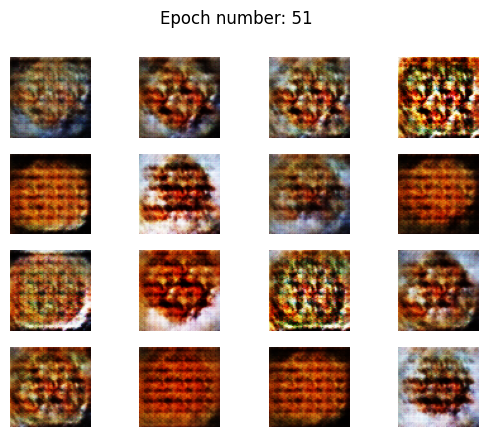

Epoch 52 (0:35:00.184609):disc loss: 1.13, gen loss: 1.21
Epoch 53 (0:35:39.177315):disc loss: 1.13, gen loss: 1.19
Epoch 54 (0:36:17.857841):disc loss: 1.15, gen loss: 1.20
Epoch 55 (0:36:55.405824):disc loss: 1.14, gen loss: 1.20
Epoch 56 (0:37:34.142872):disc loss: 1.14, gen loss: 1.23
Epoch 57 (0:38:12.839662):disc loss: 1.11, gen loss: 1.21
Epoch 58 (0:38:51.977962):disc loss: 1.13, gen loss: 1.22
Epoch 59 (0:39:29.112236):disc loss: 1.11, gen loss: 1.23
Epoch 60 (0:40:07.924776):disc loss: 1.11, gen loss: 1.24
Epoch 61 (0:40:47.011821):disc loss: 1.10, gen loss: 1.26


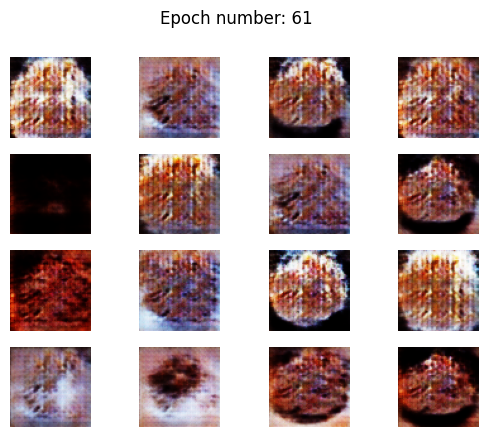

Epoch 62 (0:41:27.258632):disc loss: 1.14, gen loss: 1.28
Epoch 63 (0:42:05.416058):disc loss: 1.08, gen loss: 1.25
Epoch 64 (0:42:43.652209):disc loss: 1.10, gen loss: 1.30
Epoch 65 (0:43:22.291853):disc loss: 1.10, gen loss: 1.25
Epoch 66 (0:44:01.053223):disc loss: 1.12, gen loss: 1.25
Epoch 67 (0:44:38.340160):disc loss: 1.09, gen loss: 1.28
Epoch 68 (0:45:17.637765):disc loss: 1.10, gen loss: 1.30
Epoch 69 (0:45:56.819565):disc loss: 1.09, gen loss: 1.28
Epoch 70 (0:46:37.243194):disc loss: 1.11, gen loss: 1.28
Epoch 71 (0:47:16.368047):disc loss: 1.11, gen loss: 1.27


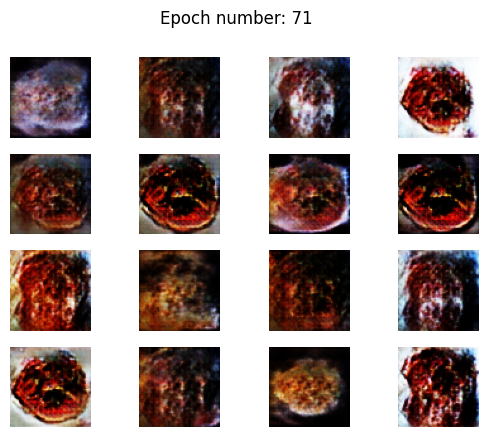

Epoch 72 (0:47:55.660132):disc loss: 1.09, gen loss: 1.27
Epoch 73 (0:48:35.137300):disc loss: 1.09, gen loss: 1.29
Epoch 74 (0:49:14.658562):disc loss: 1.11, gen loss: 1.30
Epoch 75 (0:49:54.230371):disc loss: 1.07, gen loss: 1.26
Epoch 76 (0:50:32.896668):disc loss: 1.09, gen loss: 1.30
Epoch 77 (0:51:12.083912):disc loss: 1.07, gen loss: 1.30
Epoch 78 (0:51:51.301682):disc loss: 1.06, gen loss: 1.31
Epoch 79 (0:52:29.891933):disc loss: 1.07, gen loss: 1.32
Epoch 80 (0:53:07.874629):disc loss: 1.08, gen loss: 1.35
Epoch 81 (0:53:45.773135):disc loss: 1.06, gen loss: 1.31


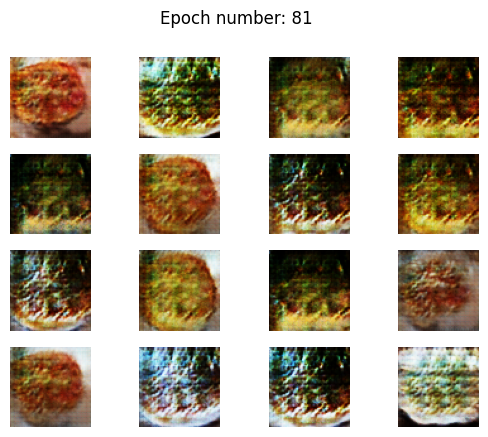

Epoch 82 (0:54:24.891386):disc loss: 1.07, gen loss: 1.33
Epoch 83 (0:55:03.247452):disc loss: 1.08, gen loss: 1.30
Epoch 84 (0:55:40.916893):disc loss: 1.08, gen loss: 1.33
Epoch 85 (0:56:18.907727):disc loss: 1.07, gen loss: 1.33
Epoch 86 (0:56:57.147771):disc loss: 1.06, gen loss: 1.34
Epoch 87 (0:57:35.141310):disc loss: 1.09, gen loss: 1.33
Epoch 88 (0:58:12.513196):disc loss: 1.06, gen loss: 1.32
Epoch 89 (0:58:51.068146):disc loss: 1.06, gen loss: 1.35
Epoch 90 (0:59:29.632896):disc loss: 1.07, gen loss: 1.31
Epoch 91 (1:00:07.656930):disc loss: 1.07, gen loss: 1.33


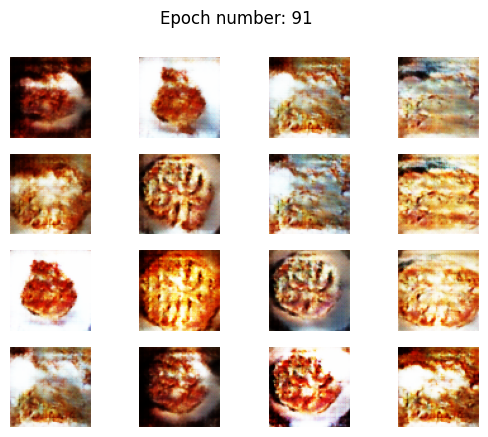

Epoch 92 (1:00:46.389752):disc loss: 1.08, gen loss: 1.34
Epoch 93 (1:01:24.766592):disc loss: 1.08, gen loss: 1.31
Epoch 94 (1:02:03.162529):disc loss: 1.08, gen loss: 1.33
Epoch 95 (1:02:40.475226):disc loss: 1.05, gen loss: 1.32
Epoch 96 (1:03:18.747706):disc loss: 1.09, gen loss: 1.32
Epoch 97 (1:04:02.912144):disc loss: 1.07, gen loss: 1.31
Epoch 98 (1:04:41.108722):disc loss: 1.06, gen loss: 1.34
Epoch 99 (1:05:20.554894):disc loss: 1.06, gen loss: 1.32
Epoch 100 (1:05:59.737784):disc loss: 1.07, gen loss: 1.33
Epoch 101 (1:06:37.385366):disc loss: 1.07, gen loss: 1.34


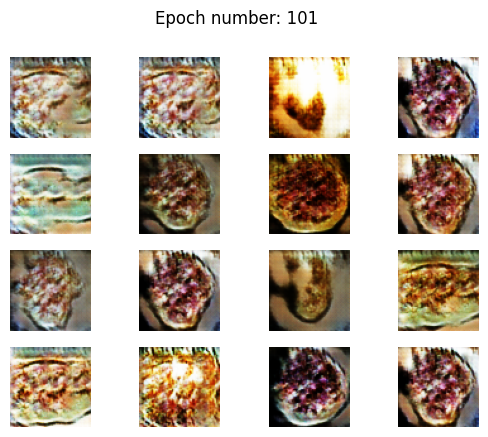

Epoch 102 (1:07:16.629525):disc loss: 1.08, gen loss: 1.34
Epoch 103 (1:07:55.288427):disc loss: 1.05, gen loss: 1.34
Epoch 104 (1:08:33.611504):disc loss: 1.05, gen loss: 1.34
Epoch 105 (1:09:11.276913):disc loss: 1.06, gen loss: 1.31
Epoch 106 (1:09:49.631697):disc loss: 1.08, gen loss: 1.33
Epoch 107 (1:10:27.832375):disc loss: 1.06, gen loss: 1.34
Epoch 108 (1:11:05.942714):disc loss: 1.06, gen loss: 1.33
Epoch 109 (1:11:44.327127):disc loss: 1.07, gen loss: 1.33
Epoch 110 (1:12:23.212281):disc loss: 1.06, gen loss: 1.37
Epoch 111 (1:13:02.111375):disc loss: 1.04, gen loss: 1.33


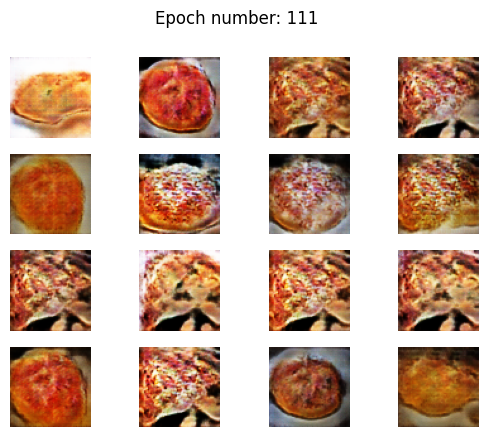

Epoch 112 (1:13:40.865680):disc loss: 1.05, gen loss: 1.33
Epoch 113 (1:14:18.931730):disc loss: 1.06, gen loss: 1.34
Epoch 114 (1:14:57.343077):disc loss: 1.07, gen loss: 1.35
Epoch 115 (1:15:36.036894):disc loss: 1.06, gen loss: 1.30
Epoch 116 (1:16:13.531403):disc loss: 1.06, gen loss: 1.33
Epoch 117 (1:16:51.784548):disc loss: 1.07, gen loss: 1.35
Epoch 118 (1:17:29.996587):disc loss: 1.05, gen loss: 1.34
Epoch 119 (1:18:08.254793):disc loss: 1.06, gen loss: 1.34
Epoch 120 (1:18:45.784048):disc loss: 1.04, gen loss: 1.33
Epoch 121 (1:19:23.936874):disc loss: 1.06, gen loss: 1.33


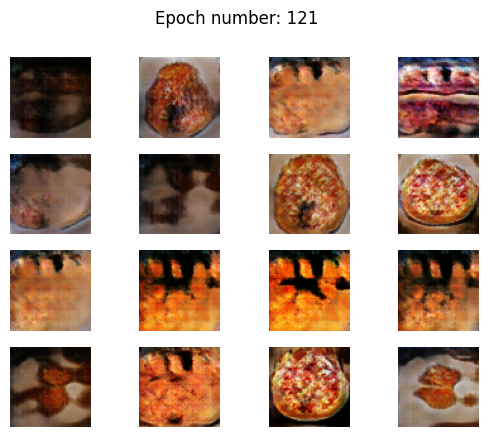

Epoch 122 (1:20:03.073387):disc loss: 1.07, gen loss: 1.32
Epoch 123 (1:20:40.633929):disc loss: 1.07, gen loss: 1.35
Epoch 124 (1:21:18.975459):disc loss: 1.07, gen loss: 1.33
Epoch 125 (1:21:57.179133):disc loss: 1.07, gen loss: 1.33
Epoch 126 (1:22:35.549385):disc loss: 1.05, gen loss: 1.33
Epoch 127 (1:23:14.417946):disc loss: 1.07, gen loss: 1.36
Epoch 128 (1:23:53.312379):disc loss: 1.06, gen loss: 1.34
Epoch 129 (1:24:32.119131):disc loss: 1.06, gen loss: 1.33
Epoch 130 (1:25:11.006716):disc loss: 1.06, gen loss: 1.33
Epoch 131 (1:25:49.821048):disc loss: 1.05, gen loss: 1.34


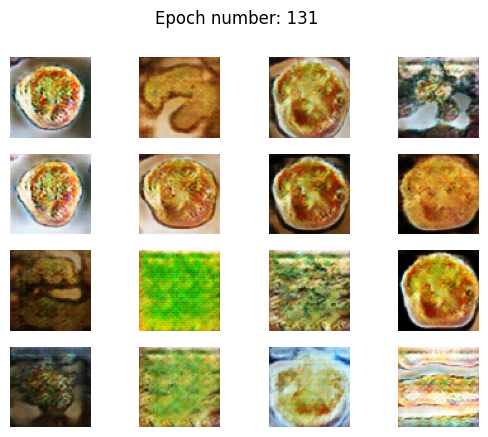

Epoch 132 (1:26:30.889684):disc loss: 1.06, gen loss: 1.32
Epoch 133 (1:27:10.311044):disc loss: 1.06, gen loss: 1.32
Epoch 134 (1:27:50.252173):disc loss: 1.06, gen loss: 1.35
Epoch 135 (1:28:29.939514):disc loss: 1.06, gen loss: 1.34
Epoch 136 (1:29:09.022162):disc loss: 1.08, gen loss: 1.32
Epoch 137 (1:29:47.638740):disc loss: 1.06, gen loss: 1.30
Epoch 138 (1:30:27.016382):disc loss: 1.05, gen loss: 1.33
Epoch 139 (1:31:06.351932):disc loss: 1.04, gen loss: 1.34
Epoch 140 (1:31:46.007545):disc loss: 1.06, gen loss: 1.36
Epoch 141 (1:32:24.736248):disc loss: 1.05, gen loss: 1.34


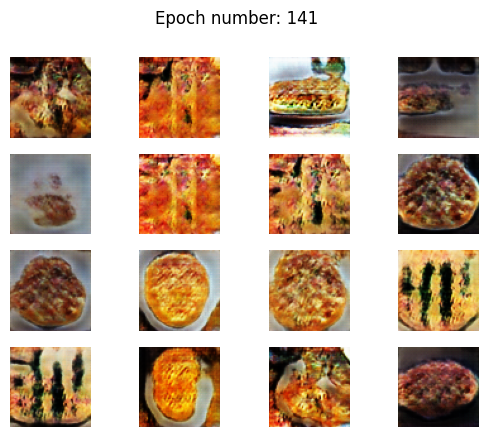

Epoch 142 (1:33:05.056589):disc loss: 1.06, gen loss: 1.34
Epoch 143 (1:33:45.774519):disc loss: 1.06, gen loss: 1.34
Epoch 144 (1:34:24.975571):disc loss: 1.05, gen loss: 1.33
Epoch 145 (1:35:04.134809):disc loss: 1.04, gen loss: 1.35
Epoch 146 (1:35:43.009666):disc loss: 1.05, gen loss: 1.34
Epoch 147 (1:36:21.623210):disc loss: 1.06, gen loss: 1.34
Epoch 148 (1:37:00.432677):disc loss: 1.05, gen loss: 1.35
Epoch 149 (1:37:38.632454):disc loss: 1.05, gen loss: 1.35
Epoch 150 (1:38:15.683313):disc loss: 1.05, gen loss: 1.33
Epoch 151 (1:38:54.305885):disc loss: 1.04, gen loss: 1.33


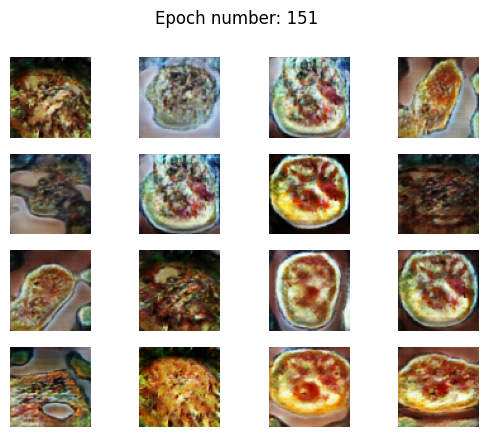

Epoch 152 (1:39:33.462051):disc loss: 1.06, gen loss: 1.37
Epoch 153 (1:40:12.204328):disc loss: 1.04, gen loss: 1.37
Epoch 154 (1:40:49.774466):disc loss: 1.05, gen loss: 1.33
Epoch 155 (1:41:28.110119):disc loss: 1.06, gen loss: 1.32
Epoch 156 (1:42:07.210354):disc loss: 1.06, gen loss: 1.34
Epoch 157 (1:42:46.144334):disc loss: 1.03, gen loss: 1.37
Epoch 158 (1:43:23.460812):disc loss: 1.04, gen loss: 1.39
Epoch 159 (1:44:01.796168):disc loss: 1.04, gen loss: 1.38
Epoch 160 (1:44:40.158671):disc loss: 1.03, gen loss: 1.34
Epoch 161 (1:45:18.076524):disc loss: 1.06, gen loss: 1.35


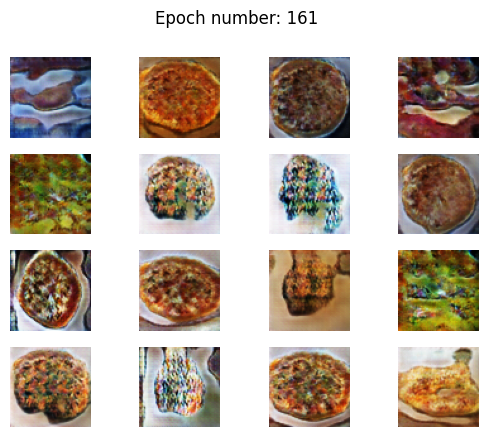

Epoch 162 (1:45:56.875415):disc loss: 1.03, gen loss: 1.34
Epoch 163 (1:46:36.551480):disc loss: 1.04, gen loss: 1.36
Epoch 164 (1:47:15.393539):disc loss: 1.06, gen loss: 1.37
Epoch 165 (1:47:54.262602):disc loss: 1.03, gen loss: 1.36
Epoch 166 (1:48:32.190839):disc loss: 1.04, gen loss: 1.35
Epoch 167 (1:49:10.955570):disc loss: 1.04, gen loss: 1.35
Epoch 168 (1:49:50.118680):disc loss: 1.05, gen loss: 1.37
Epoch 169 (1:50:29.206060):disc loss: 1.02, gen loss: 1.36
Epoch 170 (1:51:06.463243):disc loss: 1.05, gen loss: 1.37
Epoch 171 (1:51:45.322653):disc loss: 1.04, gen loss: 1.35


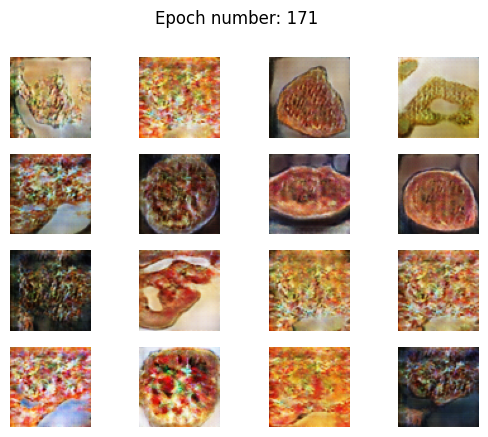

Epoch 172 (1:52:25.485154):disc loss: 1.04, gen loss: 1.35
Epoch 173 (1:53:04.335397):disc loss: 1.04, gen loss: 1.38
Epoch 174 (1:53:42.026456):disc loss: 1.05, gen loss: 1.37
Epoch 175 (1:54:20.714452):disc loss: 1.04, gen loss: 1.40
Epoch 176 (1:54:59.132522):disc loss: 1.03, gen loss: 1.39
Epoch 177 (1:55:37.859517):disc loss: 1.04, gen loss: 1.37
Epoch 178 (1:56:15.469785):disc loss: 1.02, gen loss: 1.36
Epoch 179 (1:56:54.568761):disc loss: 1.03, gen loss: 1.38
Epoch 180 (1:57:33.808592):disc loss: 1.03, gen loss: 1.37
Epoch 181 (1:58:12.516320):disc loss: 1.04, gen loss: 1.37


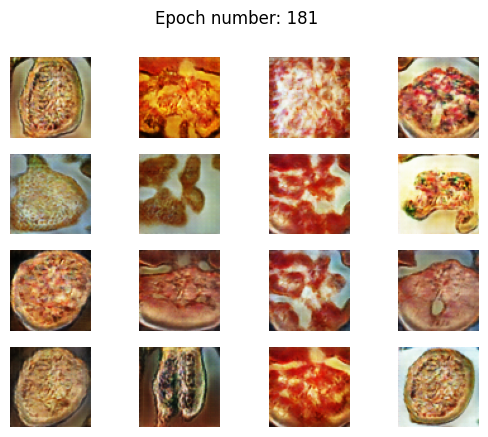

Epoch 182 (1:58:51.033719):disc loss: 1.03, gen loss: 1.37
Epoch 183 (1:59:29.408593):disc loss: 1.04, gen loss: 1.38
Epoch 184 (2:00:08.139200):disc loss: 1.03, gen loss: 1.39
Epoch 185 (2:00:46.802336):disc loss: 1.02, gen loss: 1.39
Epoch 186 (2:01:24.473639):disc loss: 1.02, gen loss: 1.38
Epoch 187 (2:02:02.901654):disc loss: 1.03, gen loss: 1.41
Epoch 188 (2:02:41.517002):disc loss: 1.03, gen loss: 1.42
Epoch 189 (2:03:19.954379):disc loss: 1.03, gen loss: 1.40
Epoch 190 (2:03:57.143872):disc loss: 1.03, gen loss: 1.39
Epoch 191 (2:04:35.804574):disc loss: 1.02, gen loss: 1.39


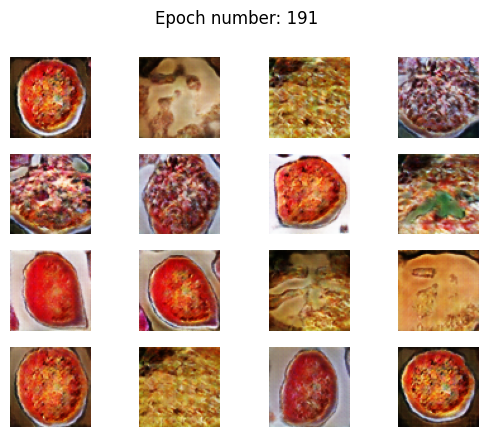

Epoch 192 (2:05:15.141152):disc loss: 1.02, gen loss: 1.40
Epoch 193 (2:05:53.739297):disc loss: 1.02, gen loss: 1.38
Epoch 194 (2:06:31.237635):disc loss: 1.04, gen loss: 1.39
Epoch 195 (2:07:09.782551):disc loss: 1.02, gen loss: 1.35
Epoch 196 (2:07:48.517446):disc loss: 1.03, gen loss: 1.38
Epoch 197 (2:08:26.645292):disc loss: 1.02, gen loss: 1.37
Epoch 198 (2:09:04.776048):disc loss: 1.04, gen loss: 1.39
Epoch 199 (2:09:43.371158):disc loss: 1.02, gen loss: 1.39
Epoch 200 (2:10:22.025356):disc loss: 1.02, gen loss: 1.40
Epoch 201 (2:10:59.784653):disc loss: 1.03, gen loss: 1.40


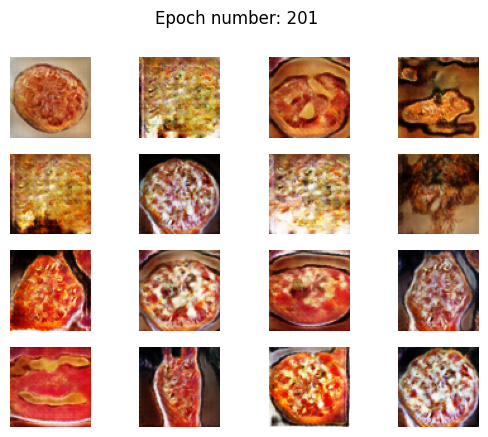

Epoch 202 (2:11:38.843677):disc loss: 1.02, gen loss: 1.39
Epoch 203 (2:12:17.648912):disc loss: 1.02, gen loss: 1.38
Epoch 204 (2:12:56.205043):disc loss: 1.03, gen loss: 1.40
Epoch 205 (2:13:34.523727):disc loss: 1.03, gen loss: 1.37
Epoch 206 (2:14:12.648092):disc loss: 1.03, gen loss: 1.39
Epoch 207 (2:14:51.286263):disc loss: 1.03, gen loss: 1.39
Epoch 208 (2:15:29.898852):disc loss: 1.02, gen loss: 1.41
Epoch 209 (2:16:07.870169):disc loss: 1.02, gen loss: 1.40
Epoch 210 (2:16:46.331019):disc loss: 1.02, gen loss: 1.40
Epoch 211 (2:17:24.908170):disc loss: 1.03, gen loss: 1.40


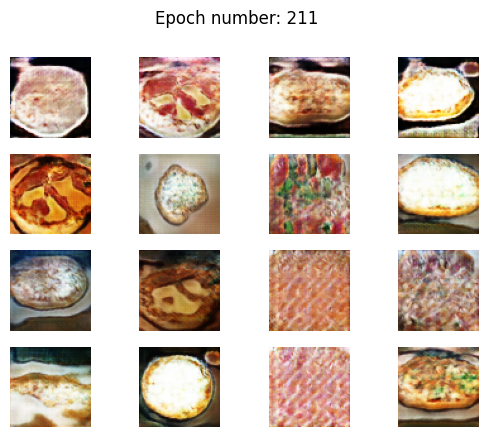

Epoch 212 (2:18:04.316088):disc loss: 1.02, gen loss: 1.40
Epoch 213 (2:18:42.504393):disc loss: 1.01, gen loss: 1.40
Epoch 214 (2:19:20.371379):disc loss: 1.01, gen loss: 1.39
Epoch 215 (2:19:59.063805):disc loss: 1.00, gen loss: 1.42
Epoch 216 (2:20:37.375542):disc loss: 1.02, gen loss: 1.41
Epoch 217 (2:21:15.014907):disc loss: 1.02, gen loss: 1.42
Epoch 218 (2:21:53.159570):disc loss: 1.02, gen loss: 1.38
Epoch 219 (2:22:31.663852):disc loss: 1.02, gen loss: 1.41
Epoch 220 (2:23:10.278722):disc loss: 1.01, gen loss: 1.39
Epoch 221 (2:23:47.925772):disc loss: 1.01, gen loss: 1.42


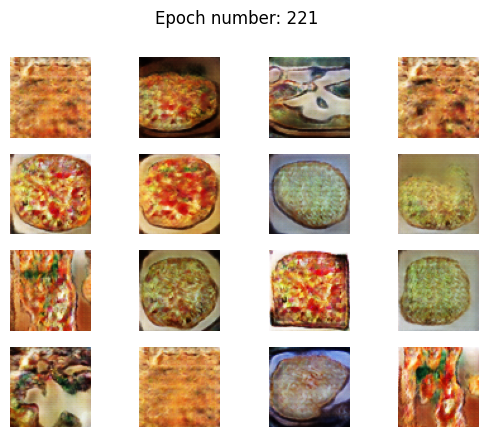

Epoch 222 (2:24:27.341423):disc loss: 1.01, gen loss: 1.41
Epoch 223 (2:25:05.972538):disc loss: 1.03, gen loss: 1.41
Epoch 224 (2:25:44.492924):disc loss: 1.01, gen loss: 1.40
Epoch 225 (2:26:21.935639):disc loss: 1.01, gen loss: 1.42
Epoch 226 (2:27:00.829113):disc loss: 1.04, gen loss: 1.42
Epoch 227 (2:27:39.512986):disc loss: 1.01, gen loss: 1.40
Epoch 228 (2:28:18.273461):disc loss: 1.01, gen loss: 1.41
Epoch 229 (2:28:55.953559):disc loss: 1.01, gen loss: 1.40
Epoch 230 (2:29:34.362264):disc loss: 1.01, gen loss: 1.41
Epoch 231 (2:30:12.941314):disc loss: 1.01, gen loss: 1.41


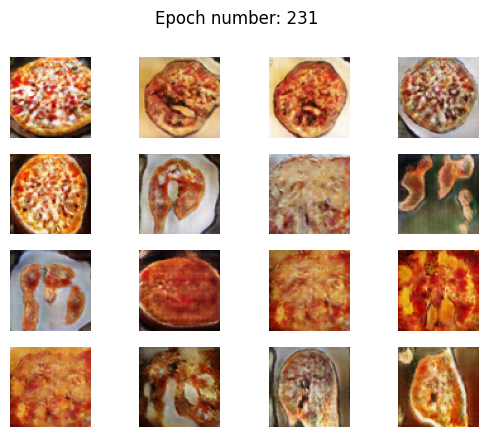

Epoch 232 (2:30:52.695955):disc loss: 1.00, gen loss: 1.42
Epoch 233 (2:31:30.419767):disc loss: 1.02, gen loss: 1.41
Epoch 234 (2:32:09.213881):disc loss: 1.01, gen loss: 1.41
Epoch 235 (2:32:48.156880):disc loss: 1.01, gen loss: 1.42
Epoch 236 (2:33:26.976350):disc loss: 1.01, gen loss: 1.41
Epoch 237 (2:34:06.043323):disc loss: 1.00, gen loss: 1.43
Epoch 238 (2:34:46.106978):disc loss: 1.02, gen loss: 1.42
Epoch 239 (2:35:26.168489):disc loss: 1.01, gen loss: 1.42
Epoch 240 (2:36:06.312792):disc loss: 1.01, gen loss: 1.42
Epoch 241 (2:36:46.416068):disc loss: 1.00, gen loss: 1.43


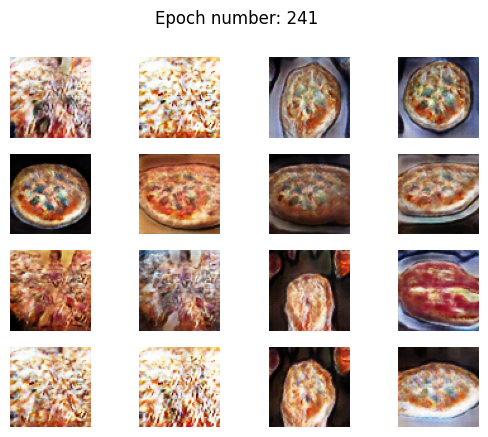

Epoch 242 (2:37:26.768350):disc loss: 1.00, gen loss: 1.42
Epoch 243 (2:38:05.428551):disc loss: 1.00, gen loss: 1.45
Epoch 244 (2:38:44.835167):disc loss: 1.01, gen loss: 1.41
Epoch 245 (2:39:24.509743):disc loss: 1.02, gen loss: 1.42
Epoch 246 (2:40:03.893365):disc loss: 1.00, gen loss: 1.43
Epoch 247 (2:40:42.709685):disc loss: 1.00, gen loss: 1.43
Epoch 248 (2:41:21.046593):disc loss: 1.00, gen loss: 1.42
Epoch 249 (2:42:00.248847):disc loss: 1.00, gen loss: 1.42
Epoch 250 (2:42:39.147320):disc loss: 1.02, gen loss: 1.44
Epoch 251 (2:43:17.735096):disc loss: 1.01, gen loss: 1.42


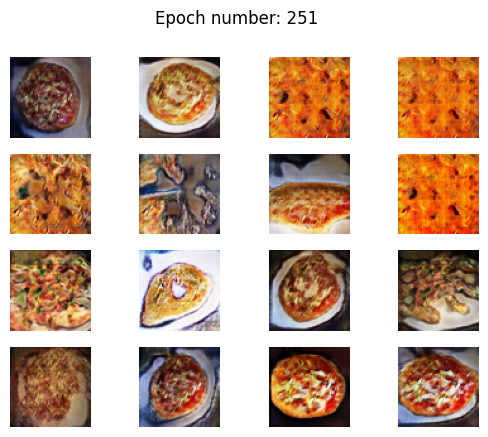

Epoch 252 (2:43:56.600390):disc loss: 1.00, gen loss: 1.43
Epoch 253 (2:44:35.578332):disc loss: 1.00, gen loss: 1.41
Epoch 254 (2:45:14.728592):disc loss: 1.01, gen loss: 1.43
Epoch 255 (2:45:54.100152):disc loss: 1.00, gen loss: 1.42
Epoch 256 (2:46:32.219365):disc loss: 1.00, gen loss: 1.43
Epoch 257 (2:47:11.511235):disc loss: 1.02, gen loss: 1.43
Epoch 258 (2:47:50.547560):disc loss: 1.00, gen loss: 1.42
Epoch 259 (2:48:29.624755):disc loss: 1.00, gen loss: 1.41
Epoch 260 (2:49:07.896314):disc loss: 1.00, gen loss: 1.42
Epoch 261 (2:49:46.742096):disc loss: 1.00, gen loss: 1.43


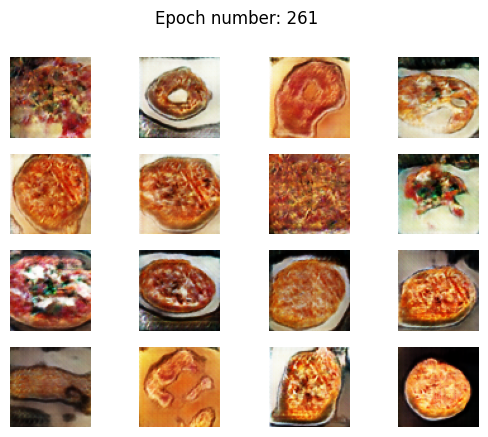

Epoch 262 (2:50:26.529242):disc loss: 1.01, gen loss: 1.41
Epoch 263 (2:51:05.575351):disc loss: 1.00, gen loss: 1.43
Epoch 264 (2:51:44.452987):disc loss: 1.00, gen loss: 1.43
Epoch 265 (2:52:23.118627):disc loss: 1.00, gen loss: 1.43
Epoch 266 (2:53:02.548263):disc loss: 1.00, gen loss: 1.44
Epoch 267 (2:53:42.360541):disc loss: 1.01, gen loss: 1.40
Epoch 268 (2:54:22.093108):disc loss: 1.00, gen loss: 1.42
Epoch 269 (2:55:00.979895):disc loss: 1.00, gen loss: 1.43
Epoch 270 (2:55:40.057907):disc loss: 1.00, gen loss: 1.42
Epoch 271 (2:56:19.338035):disc loss: 0.99, gen loss: 1.43


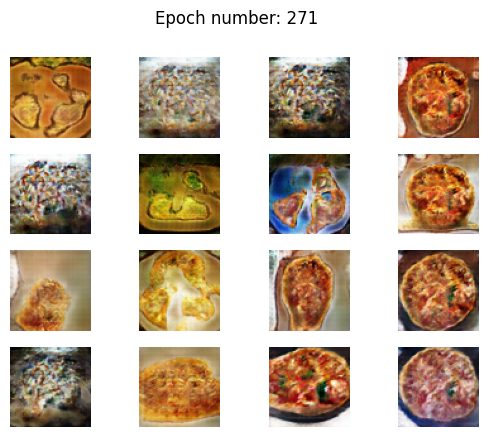

Epoch 272 (2:56:59.233478):disc loss: 1.01, gen loss: 1.43
Epoch 273 (2:57:38.528612):disc loss: 1.00, gen loss: 1.44
Epoch 274 (2:58:17.035055):disc loss: 0.99, gen loss: 1.43
Epoch 275 (2:58:56.665936):disc loss: 1.00, gen loss: 1.42
Epoch 276 (2:59:36.277004):disc loss: 1.01, gen loss: 1.43
Epoch 277 (3:00:15.626629):disc loss: 1.00, gen loss: 1.44
Epoch 278 (3:00:54.672451):disc loss: 0.99, gen loss: 1.42
Epoch 279 (3:01:33.348560):disc loss: 1.00, gen loss: 1.43
Epoch 280 (3:02:12.765806):disc loss: 1.01, gen loss: 1.43
Epoch 281 (3:02:52.074629):disc loss: 1.00, gen loss: 1.43


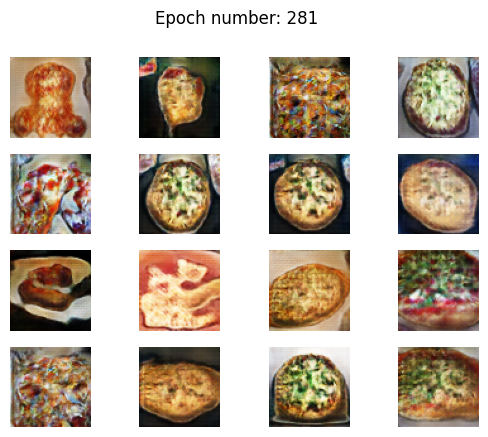

Epoch 282 (3:03:32.229342):disc loss: 1.00, gen loss: 1.43
Epoch 283 (3:04:11.607501):disc loss: 1.00, gen loss: 1.43
Epoch 284 (3:04:50.697668):disc loss: 1.00, gen loss: 1.42
Epoch 285 (3:05:30.053374):disc loss: 1.00, gen loss: 1.41
Epoch 286 (3:06:09.091379):disc loss: 1.00, gen loss: 1.44
Epoch 287 (3:06:48.228415):disc loss: 0.99, gen loss: 1.42
Epoch 288 (3:07:26.707795):disc loss: 1.00, gen loss: 1.43
Epoch 289 (3:08:05.942015):disc loss: 1.00, gen loss: 1.45
Epoch 290 (3:08:45.634492):disc loss: 1.00, gen loss: 1.43
Epoch 291 (3:09:25.043902):disc loss: 1.01, gen loss: 1.44


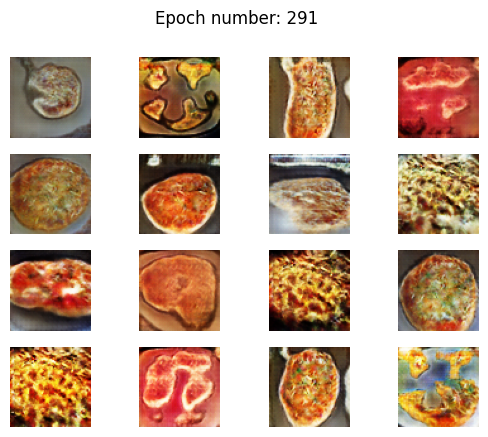

Epoch 292 (3:10:05.074727):disc loss: 0.99, gen loss: 1.44
Epoch 293 (3:10:43.665782):disc loss: 0.99, gen loss: 1.43
Epoch 294 (3:11:22.784487):disc loss: 0.99, gen loss: 1.44
Epoch 295 (3:12:02.031296):disc loss: 1.00, gen loss: 1.41
Epoch 296 (3:12:41.020609):disc loss: 1.00, gen loss: 1.42
Epoch 297 (3:13:19.038610):disc loss: 1.00, gen loss: 1.43
Epoch 298 (3:13:58.129552):disc loss: 1.00, gen loss: 1.42
Epoch 299 (3:14:37.183106):disc loss: 1.00, gen loss: 1.43
Epoch 300 (3:15:16.440727):disc loss: 1.00, gen loss: 1.43
Epoch 301 (3:15:54.355993):disc loss: 1.01, gen loss: 1.42


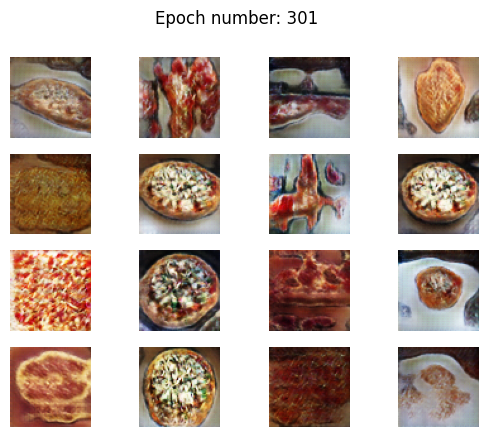

Epoch 302 (3:16:35.215509):disc loss: 1.00, gen loss: 1.42
Epoch 303 (3:17:14.881282):disc loss: 1.00, gen loss: 1.43
Epoch 304 (3:18:06.589619):disc loss: 1.00, gen loss: 1.42
Epoch 305 (3:18:44.859882):disc loss: 1.00, gen loss: 1.43
Epoch 306 (3:19:24.436688):disc loss: 0.99, gen loss: 1.43
Epoch 307 (3:20:05.356714):disc loss: 0.99, gen loss: 1.43
Epoch 308 (3:20:45.051750):disc loss: 0.99, gen loss: 1.43
Epoch 309 (3:21:25.825907):disc loss: 1.00, gen loss: 1.44
Epoch 310 (3:22:05.962718):disc loss: 1.00, gen loss: 1.43
Epoch 311 (3:22:44.181851):disc loss: 1.00, gen loss: 1.43


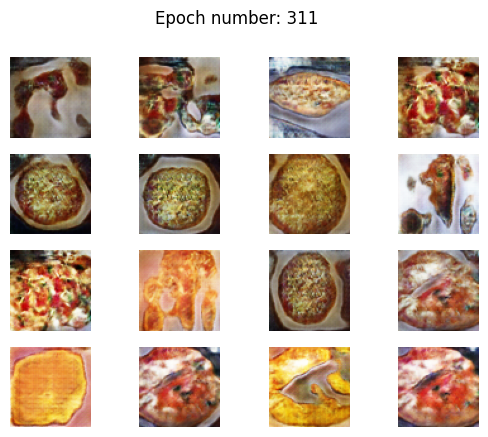

Epoch 312 (3:23:24.462825):disc loss: 1.00, gen loss: 1.44
Epoch 313 (3:24:03.503430):disc loss: 1.00, gen loss: 1.45
Epoch 314 (3:24:42.567169):disc loss: 0.99, gen loss: 1.44
Epoch 315 (3:25:20.914603):disc loss: 1.00, gen loss: 1.43
Epoch 316 (3:25:59.693667):disc loss: 0.99, gen loss: 1.43
Epoch 317 (3:26:38.438581):disc loss: 0.99, gen loss: 1.44
Epoch 318 (3:27:17.219336):disc loss: 0.99, gen loss: 1.43
Epoch 319 (3:27:55.461501):disc loss: 1.00, gen loss: 1.44
Epoch 320 (3:28:34.377577):disc loss: 1.00, gen loss: 1.43
Epoch 321 (3:29:13.285682):disc loss: 0.99, gen loss: 1.44


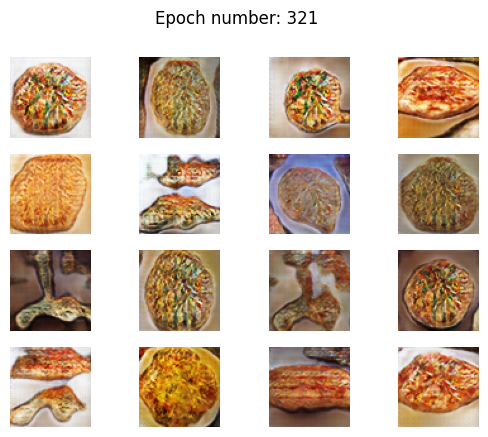

Epoch 322 (3:29:53.241260):disc loss: 0.99, gen loss: 1.44
Epoch 323 (3:30:32.639602):disc loss: 0.99, gen loss: 1.43
Epoch 324 (3:31:11.191128):disc loss: 1.00, gen loss: 1.44
Epoch 325 (3:31:50.619017):disc loss: 0.99, gen loss: 1.43
Epoch 326 (3:32:29.904108):disc loss: 1.00, gen loss: 1.44
Epoch 327 (3:33:09.629524):disc loss: 0.99, gen loss: 1.42
Epoch 328 (3:33:48.034904):disc loss: 1.00, gen loss: 1.44
Epoch 329 (3:34:26.613306):disc loss: 0.99, gen loss: 1.43
Epoch 330 (3:35:06.170086):disc loss: 0.99, gen loss: 1.44
Epoch 331 (3:35:45.357354):disc loss: 1.00, gen loss: 1.45


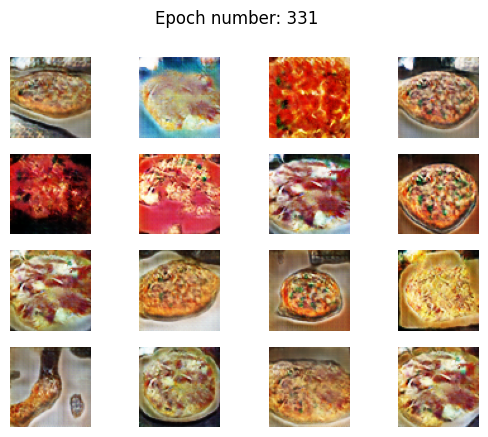

Epoch 332 (3:36:24.783487):disc loss: 0.99, gen loss: 1.45
Epoch 333 (3:37:03.344500):disc loss: 0.99, gen loss: 1.44


KeyboardInterrupt: ignored

In [11]:
train(600)

# **Resources I found really helpful**
*   https://medium.com/@kums220/using-generative-adversarial-networks-to-create-dog-images-7dece0572e23
*   https://arxiv.org/pdf/1511.06434.pdf

